Import all relevant libraries for the project

In [4]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json, urllib.request  # library to handle JSON files 

!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim 

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes 
import folium # map rendering library

print('Libraries imported.')

Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.

Libraries imported.


In [11]:

with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)


In [12]:
neighborhoods_data = newyork_data['features']

Transform data into dataframe 

In [13]:
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

neighborhoods = pd.DataFrame(columns=column_names)

for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)


In [14]:
neighborhoods.head(10)

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585
5,Bronx,Kingsbridge,40.881687,-73.902818
6,Manhattan,Marble Hill,40.876551,-73.910660
7,Bronx,Woodlawn,40.898273,-73.867315
8,Bronx,Norwood,40.877224,-73.879391
9,Bronx,Williamsbridge,40.881039,-73.857446


Collecting data from Manhattan burrough only

In [47]:
manhattan_data = neighborhoods[neighborhoods['Borough'] == 'Manhattan'].reset_index(drop=True)
manhattan_data.head(10)


,Borough,Neighborhood,Latitude,Longitude
0,Manhattan,Marble Hill,40.876551,-73.910660
1,Manhattan,Chinatown,40.715618,-73.994279
2,Manhattan,Washington Heights,40.851903,-73.936900
3,Manhattan,Inwood,40.867684,-73.921210
4,Manhattan,Hamilton Heights,40.823604,-73.949688
5,Manhattan,Manhattanville,40.816934,-73.957385
6,Manhattan,Central Harlem,40.815976,-73.943211
7,Manhattan,East Harlem,40.792249,-73.944182
8,Manhattan,Upper East Side,40.775639,-73.960508
9,Manhattan,Yorkville,40.775930,-73.947118


Get geographical data for Manhattan

In [16]:
address = 'Manhattan, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Manhattan are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Manhattan are 40.7896239, -73.9598939.


In [17]:
# create map of Manhattan using latitude and longitude values
map_manhattan = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, label in zip(manhattan_data['Latitude'], manhattan_data['Longitude'], manhattan_data['Neighborhood']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_manhattan)  
    
map_manhattan

Define Foursquare Credentials and Version

In [19]:
CLIENT_ID = 'XY3T2AQ4J3XOZHLJWEK3ZUGQMTVQFE2XHHSLTXJSJPRJWRDV' # your Foursquare ID
CLIENT_SECRET = 'CK4NVLGGLGO223XG0WNWEYCXORRWIE3VYRPJ0MMPYSAUTITB' # your Foursquare Secret
VERSION = '20200425'# Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: XY3T2AQ4J3XOZHLJWEK3ZUGQMTVQFE2XHHSLTXJSJPRJWRDV
CLIENT_SECRET:CK4NVLGGLGO223XG0WNWEYCXORRWIE3VYRPJ0MMPYSAUTITB


Get 100 venues within 500 meters of each neighborhood

In [42]:
LIMIT = 100;
radius = 500;

Function to get venues for a given neighborhood 

In [43]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [48]:
# run the above function to get venues for each neighborhood
manhattan_venues = getNearbyVenues(names=manhattan_data['Neighborhood'],
                                   latitudes=manhattan_data['Latitude'],
                                   longitudes=manhattan_data['Longitude']
                                  )



Marble Hill
Chinatown
Washington Heights
Inwood
Hamilton Heights
Manhattanville
Central Harlem
East Harlem
Upper East Side
Yorkville
Lenox Hill
Roosevelt Island
Upper West Side
Lincoln Square
Clinton
Midtown
Murray Hill
Chelsea
Greenwich Village
East Village
Lower East Side
Tribeca
Little Italy
Soho
West Village
Manhattan Valley
Morningside Heights
Gramercy
Battery Park City
Financial District
Carnegie Hill
Noho
Civic Center
Midtown South
Sutton Place
Turtle Bay
Tudor City
Stuyvesant Town
Flatiron
Hudson Yards


In [49]:
manhattan_venues.head(10)

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Marble Hill,40.876551,-73.91066,Arturo's,40.874412,-73.910271,Pizza Place
1,Marble Hill,40.876551,-73.91066,Bikram Yoga,40.876844,-73.906204,Yoga Studio
2,Marble Hill,40.876551,-73.91066,Tibbett Diner,40.880404,-73.908937,Diner
3,Marble Hill,40.876551,-73.91066,Starbucks,40.877531,-73.905582,Coffee Shop
4,Marble Hill,40.876551,-73.91066,Dunkin',40.877136,-73.906666,Donut Shop
5,Marble Hill,40.876551,-73.91066,Rite Aid,40.875467,-73.908906,Pharmacy
6,Marble Hill,40.876551,-73.91066,TCR The Club of Riverdale,40.878628,-73.914568,Tennis Stadium
7,Marble Hill,40.876551,-73.91066,Land & Sea Restaurant,40.877885,-73.905873,Seafood Restaurant
8,Marble Hill,40.876551,-73.91066,Starbucks,40.873755,-73.908613,Coffee Shop
9,Marble Hill,40.876551,-73.91066,Astral Fitness & Wellness Center,40.876705,-73.906372,Gym


In [50]:
manhattan_venues.groupby('Venue Category').count()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude
Venue Category,,,,,,
Accessories Store,1,1,1,1,1,1
Adult Boutique,1,1,1,1,1,1
Afghan Restaurant,1,1,1,1,1,1
African Restaurant,3,3,3,3,3,3
American Restaurant,70,70,70,70,70,70
Antique Shop,1,1,1,1,1,1
Arcade,1,1,1,1,1,1
Arepa Restaurant,2,2,2,2,2,2
Argentinian Restaurant,5,5,5,5,5,5


In [51]:
#for the purpose of this project Coffee Shop category is relabelled as Cafe 


manhattan_venues['Venue Category']=manhattan_venues['Venue Category'].str.replace('Coffee Shop','Café') # replace Coffee Shop with Cafe
manhattan_venues.head(10)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Marble Hill,40.876551,-73.91066,Arturo's,40.874412,-73.910271,Pizza Place
1,Marble Hill,40.876551,-73.91066,Bikram Yoga,40.876844,-73.906204,Yoga Studio
2,Marble Hill,40.876551,-73.91066,Tibbett Diner,40.880404,-73.908937,Diner
3,Marble Hill,40.876551,-73.91066,Starbucks,40.877531,-73.905582,Café
4,Marble Hill,40.876551,-73.91066,Dunkin',40.877136,-73.906666,Donut Shop
5,Marble Hill,40.876551,-73.91066,Rite Aid,40.875467,-73.908906,Pharmacy
6,Marble Hill,40.876551,-73.91066,TCR The Club of Riverdale,40.878628,-73.914568,Tennis Stadium
7,Marble Hill,40.876551,-73.91066,Land & Sea Restaurant,40.877885,-73.905873,Seafood Restaurant
8,Marble Hill,40.876551,-73.91066,Starbucks,40.873755,-73.908613,Café
9,Marble Hill,40.876551,-73.91066,Astral Fitness & Wellness Center,40.876705,-73.906372,Gym


In [52]:
# one hot encoding
manhattan_onehot = pd.get_dummies(manhattan_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
manhattan_onehot['Neighborhood'] = manhattan_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [manhattan_onehot.columns[-1]] + list(manhattan_onehot.columns[:-1])
manhattan_onehot = manhattan_onehot[fixed_columns]

manhattan_onehot.head()

,Neighborhood,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Basketball Stadium,Beer Bar,Beer Garden,Beer Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Bridal Shop,Bridge,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cambodian Restaurant,Camera Store,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,College Academic Building,College Arts Building,College Bookstore,College Cafeteria,College Theater,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Financial or Legal Service,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Gaming Cafe,Garden,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Latin American Restaurant,Laundry Service,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Movie Theater,Museum,Music School,Music Venue,Nail Salon,New American Restaurant,Newsstand,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Paella Restaurant,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Café,Pet Service,Pet Store,Pharmacy,Photography Studio,Physical Therapist,Pie Shop,Pier,Pilates Studio,Pizza Place,Playground,Plaza,Poke Place,Pool,Pub,Public Art,Ramen Restaurant,Record Shop,Rental Car Location,Residential Building (Apartment / Condo),Resort,Rest Area,Restaurant,River,Rock Climbing Spot,Rock Club,Roof Deck,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shanghai Restaurant,Shipping Store,Shoe Store,Shopping Mall,Skate

In [53]:
manhattan_grouped = manhattan_onehot.groupby('Neighborhood').mean().reset_index()
manhattan_grouped

,Neighborhood,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Basketball Stadium,Beer Bar,Beer Garden,Beer Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Bridal Shop,Bridge,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cambodian Restaurant,Camera Store,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,College Academic Building,College Arts Building,College Bookstore,College Cafeteria,College Theater,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Financial or Legal Service,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Gaming Cafe,Garden,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Latin American Restaurant,Laundry Service,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Movie Theater,Museum,Music School,Music Venue,Nail Salon,New American Restaurant,Newsstand,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Paella Restaurant,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Café,Pet Service,Pet Store,Pharmacy,Photography Studio,Physical Therapist,Pie Shop,Pier,Pilates Studio,Pizza Place,Playground,Plaza,Poke Place,Pool,Pub,Public Art,Ramen Restaurant,Record Shop,Rental Car Location,Residential Building (Apartment / Condo),Resort,Rest Area,Restaurant,River,Rock Climbing Spot,Rock Club,Roof Deck,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shanghai Restaurant,Shipping Store,Shoe Store,Shopping Mall,Skate

In [54]:
num_top_venues = 5

for hood in manhattan_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = manhattan_grouped[manhattan_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Battery Park City----
           venue  freq
0           Park  0.12
1           Café  0.08
2          Hotel  0.06
3  Memorial Site  0.05
4            Gym  0.05


----Carnegie Hill----
                 venue  freq
0                 Café  0.15
1          Pizza Place  0.05
2          Yoga Studio  0.04
3            Wine Shop  0.04
4  Japanese Restaurant  0.04


----Central Harlem----
                 venue  freq
0   African Restaurant  0.07
1    French Restaurant  0.04
2  American Restaurant  0.04
3                  Bar  0.04
4   Chinese Restaurant  0.04


----Chelsea----
                 venue  freq
0                 Café  0.11
1          Art Gallery  0.10
2  American Restaurant  0.03
3       Ice Cream Shop  0.03
4               Bakery  0.03


----Chinatown----
                venue  freq
0  Chinese Restaurant  0.06
1              Bakery  0.05
2     Bubble Tea Shop  0.04
3        Cocktail Bar  0.04
4                 Spa  0.03


----Civic Center----
                 venue  freq
0      

In [55]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [57]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = manhattan_grouped['Neighborhood']

for ind in np.arange(manhattan_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(manhattan_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Battery Park City,Park,Café,Hotel,Gym,Memorial Site,Plaza,Shopping Mall,Gourmet Shop,Food Court,Boat or Ferry
1,Carnegie Hill,Café,Pizza Place,Yoga Studio,Bookstore,Wine Shop,Gym,Japanese Restaurant,Gym / Fitness Center,Cosmetics Shop,French Restaurant
2,Central Harlem,African Restaurant,Cosmetics Shop,Bar,Seafood Restaurant,French Restaurant,Chinese Restaurant,American Restaurant,Market,Southern / Soul Food Restaurant,Caribbean Restaurant
3,Chelsea,Café,Art Gallery,American Restaurant,Ice Cream Shop,Bakery,Cupcake Shop,Seafood Restaurant,Italian Restaurant,Nightclub,Park
4,Chinatown,Chinese Restaurant,Bakery,Cocktail Bar,Bubble Tea Shop,Salon / Barbershop,Spa,Ice Cream Shop,American Restaurant,Optical Shop,Vietnamese Restaurant
5,Civic Center,Café,French Restaurant,American Restaurant,Park,Cocktail Bar,Spa,Hotel,Gym / Fitness Center,Yoga Studio,Wine Shop
6,Clinton,Theater,Café,Gym / Fitness Center,Italian Restaurant,Gym,Hotel,Thai Restaurant,Spa,Sandwich Place,Pizza Place
7,East Harlem,Mexican Restaurant,Bakery,Thai Restaurant,Latin American Restaurant,Deli / Bodega,Spa,Sandwich Place,Beer Bar,Liquor Store,Gas Station
8,East Village,Mexican Restaurant,Cocktail Bar,Café,Bar,Pizza Place,Ramen Restaurant,Ice Cream Shop,Wine Bar,Juice Bar,Dessert Shop
9,Financial District,Café,American Restaurant,Pizza Place,Hotel,Juice Bar,Bar,Mexican Restaurant,Event Space,Cocktail Bar,Steakhouse


In [58]:
neighborhoods_venues_sorted


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Battery Park City,Park,Café,Hotel,Gym,Memorial Site,Plaza,Shopping Mall,Gourmet Shop,Food Court,Boat or Ferry
1,Carnegie Hill,Café,Pizza Place,Yoga Studio,Bookstore,Wine Shop,Gym,Japanese Restaurant,Gym / Fitness Center,Cosmetics Shop,French Restaurant
2,Central Harlem,African Restaurant,Cosmetics Shop,Bar,Seafood Restaurant,French Restaurant,Chinese Restaurant,American Restaurant,Market,Southern / Soul Food Restaurant,Caribbean Restaurant
3,Chelsea,Café,Art Gallery,American Restaurant,Ice Cream Shop,Bakery,Cupcake Shop,Seafood Restaurant,Italian Restaurant,Nightclub,Park
4,Chinatown,Chinese Restaurant,Bakery,Cocktail Bar,Bubble Tea Shop,Salon / Barbershop,Spa,Ice Cream Shop,American Restaurant,Optical Shop,Vietnamese Restaurant
5,Civic Center,Café,French Restaurant,American Restaurant,Park,Cocktail Bar,Spa,Hotel,Gym / Fitness Center,Yoga Studio,Wine Shop
6,Clinton,Theater,Café,Gym / Fitness Center,Italian Restaurant,Gym,Hotel,Thai Restaurant,Spa,Sandwich Place,Pizza Place
7,East Harlem,Mexican Restaurant,Bakery,Thai Restaurant,Latin American Restaurant,Deli / Bodega,Spa,Sandwich Place,Beer Bar,Liquor Store,Gas Station
8,East Village,Mexican Restaurant,Cocktail Bar,Café,Bar,Pizza Place,Ramen Restaurant,Ice Cream Shop,Wine Bar,Juice Bar,Dessert Shop
9,Financial District,Café,American Restaurant,Pizza Place,Hotel,Juice Bar,Bar,Mexican Restaurant,Event Space,Cocktail Bar,Steakhouse


In [59]:
corr_mat = manhattan_grouped.corr()  #obtaining correlation matric

In [64]:
corr_mat.shape

(328, 328)

In [89]:
corr_mat

,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Basketball Stadium,Beer Bar,Beer Garden,Beer Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Bridal Shop,Bridge,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cambodian Restaurant,Camera Store,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,College Academic Building,College Arts Building,College Bookstore,College Cafeteria,College Theater,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Financial or Legal Service,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Gaming Cafe,Garden,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Latin American Restaurant,Laundry Service,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Movie Theater,Museum,Music School,Music Venue,Nail Salon,New American Restaurant,Newsstand,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Paella Restaurant,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Café,Pet Service,Pet Store,Pharmacy,Photography Studio,Physical Therapist,Pie Shop,Pier,Pilates Studio,Pizza Place,Playground,Plaza,Poke Place,Pool,Pub,Public Art,Ramen Restaurant,Record Shop,Rental Car Location,Residential Building (Apartment / Condo),Resort,Rest Area,Restaurant,River,Rock Climbing Spot,Rock Club,Roof Deck,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shanghai Restaurant,Shipping Store,Shoe Store,Shopping Mall,Skate Park,Smoke S

In [90]:
corr_mat_cafe = pd.DataFrame(corr_mat['Café'])
corr_mat_cafe

,Café
Accessories Store,0.047025
Adult Boutique,-0.101100
Afghan Restaurant,0.149026
African Restaurant,-0.259498
American Restaurant,0.129948
Antique Shop,0.057541
Arcade,-0.065916
Arepa Restaurant,-0.038511
Argentinian Restaurant,0.142373
Art Gallery,0.058421


In [74]:
corr_mat_cafe.sort_values(by='Café',ascending=False,inplace = True)

In [79]:
corr_mat_cafe.drop('Café',inplace=True)
corr_mat_cafe.head(10)

,Café
Yoga Studio,0.427967
Community Center,0.410027
Shipping Store,0.380205
Pub,0.369350
Pizza Place,0.359486
Martial Arts Dojo,0.332274
Indian Restaurant,0.329098
Sushi Restaurant,0.296005
Wine Shop,0.288737
Pet Store,0.284515


In [82]:
# import the visualization package: seaborn
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 

Text(0, 0.5, 'Café')

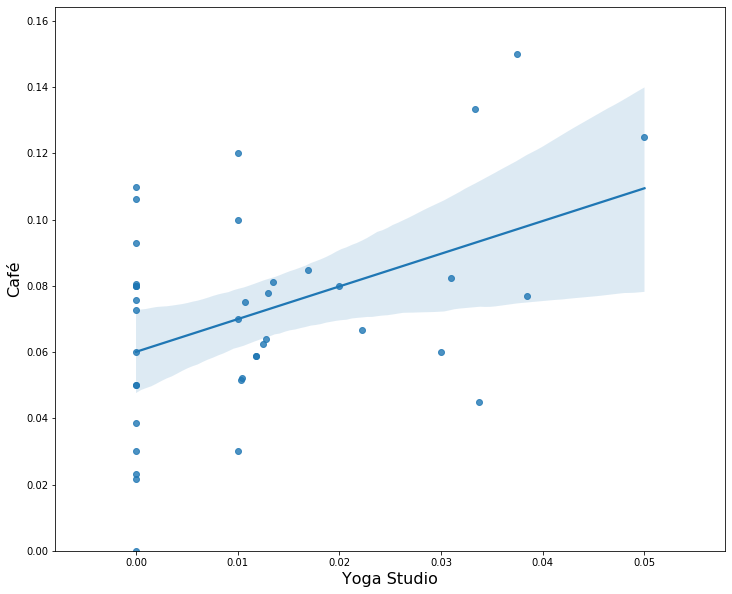

In [86]:
width = 12
height = 10
plt.figure(figsize=(width, height))
sns.regplot(x="Yoga Studio", y="Café", data=manhattan_grouped)
plt.ylim(0,)
plt.xlabel('Yoga Studio', fontsize=16)
plt.ylabel('Café', fontsize=16)

Text(0, 0.5, 'Café')

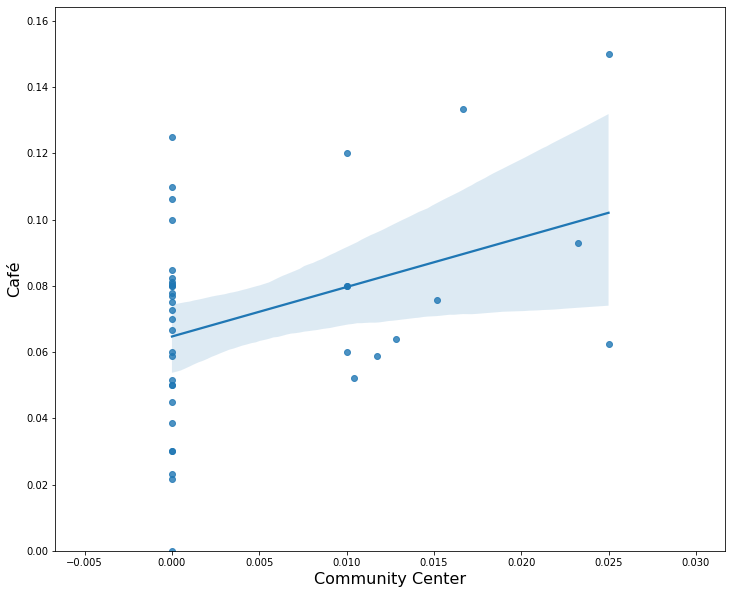

In [88]:
width = 12
height = 10
plt.figure(figsize=(width, height))
sns.regplot(x="Pub", y="Café", data=manhattan_grouped)
plt.ylim(0,)
plt.xlabel('Community Center', fontsize=16)
plt.ylabel('Café', fontsize=16)

In [94]:
manhattan_venues['Venue Category'].value_counts()
temp_df = pd.DataFrame(manhattan_venues['Venue Category'].value_counts())
temp_df.head()

,Venue Category
Café,224
Italian Restaurant,104
Pizza Place,82
Bakery,73
Park,72


In [98]:
corr_mat_cafe.join(temp_df)

,Café,Venue Category
Café,1.000000,224
Yoga Studio,0.427967,34
Community Center,0.410027,1
Shipping Store,0.380205,4
Pub,0.369350,14
Pizza Place,0.359486,82
Martial Arts Dojo,0.332274,3
Indian Restaurant,0.329098,19
Sushi Restaurant,0.296005,46
Wine Shop,0.288737,45


Text(0, 0.5, 'Café')

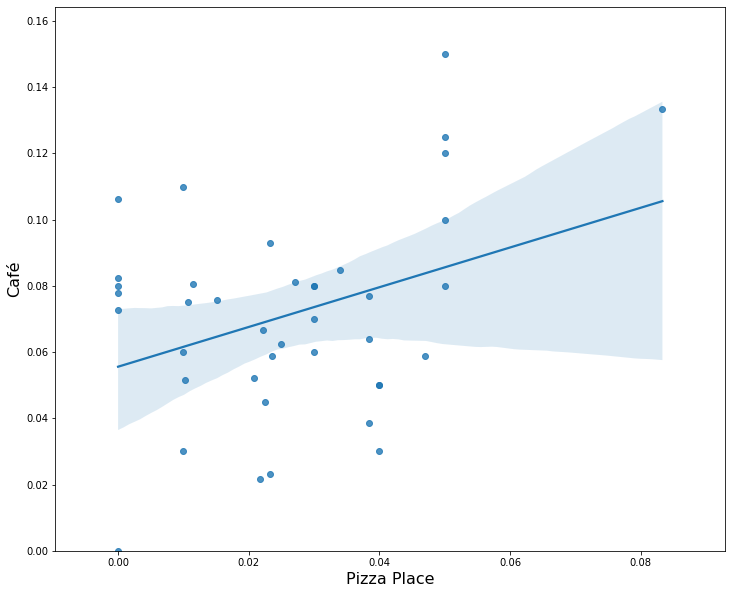

In [99]:
width = 12
height = 10
plt.figure(figsize=(width, height))
sns.regplot(x="Pizza Place", y="Café", data=manhattan_grouped)
plt.ylim(0,)
plt.xlabel('Pizza Place', fontsize=16)
plt.ylabel('Café', fontsize=16)

In [107]:
temp = corr_mat_cafe.join(temp_df)
temp.head()

,Café,Venue Category
Café,1.000000,224
Yoga Studio,0.427967,34
Community Center,0.410027,1
Shipping Store,0.380205,4
Pub,0.369350,14


In [108]:
temp.drop(temp[temp['Venue Category']<10].index,inplace=True)

In [109]:
temp.head()

,Café,Venue Category
Café,1.000000,224
Yoga Studio,0.427967,34
Pub,0.369350,14
Pizza Place,0.359486,82
Indian Restaurant,0.329098,19


In [110]:
temp.drop('Café',inplace=True)
temp.head(10)

,Café,Venue Category
Yoga Studio,0.427967,34
Pub,0.369350,14
Pizza Place,0.359486,82
Indian Restaurant,0.329098,19
Sushi Restaurant,0.296005,46
Wine Shop,0.288737,45
Pet Store,0.284515,15
Food Truck,0.255120,10
Japanese Restaurant,0.241693,38
Deli / Bodega,0.238635,35


Based on the above result we will use Yoga Studio, Pizza Place, and Sushi Restaurant as predictors

In [112]:
Z = manhattan_grouped[['Yoga Studio','Pizza Place','Sushi Restaurant']]
Z.head()

,Yoga Studio,Pizza Place,Sushi Restaurant
0,0.0000,0.015152,0.0000
1,0.0375,0.050000,0.0125
2,0.0000,0.021739,0.0000
3,0.0000,0.010000,0.0100
4,0.0100,0.010000,0.0000


In [114]:
from sklearn.linear_model import LinearRegression
lm = LinearRegression()

In [115]:
lm.fit(Z, manhattan_grouped['Café']) #using multiple regression linear model

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [116]:
lm.intercept_

0.046695666207963615

In [117]:
lm.coef_

array([0.79403004, 0.33191084, 0.52873641])

In [120]:
Y_hat = lm.predict(Z)

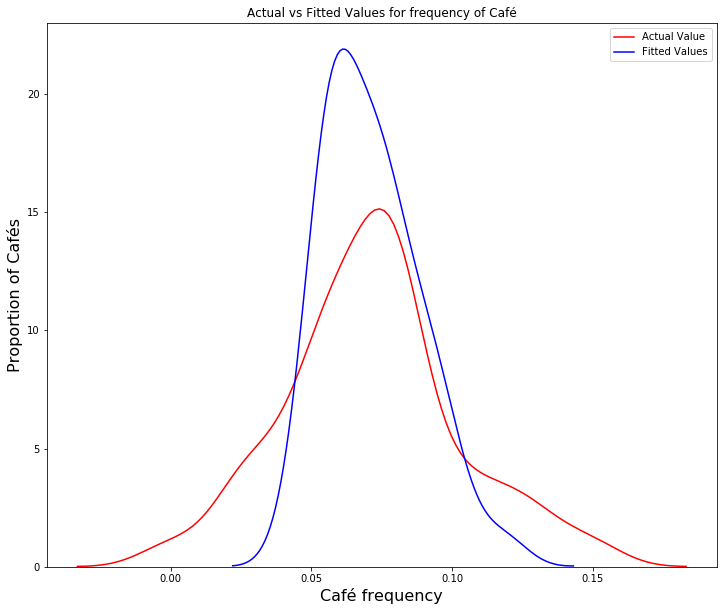

In [123]:
plt.figure(figsize=(width, height))


ax1 = sns.distplot(manhattan_grouped['Café'], hist=False, color="r", label="Actual Value")
sns.distplot(Y_hat, hist=False, color="b", label="Fitted Values" , ax=ax1)


plt.title('Actual vs Fitted Values for frequency of Café')
plt.xlabel('Café frequency',fontsize=16)
plt.ylabel('Proportion of Cafés',fontsize=16)

plt.show()
plt.close()

In [130]:
temp = neighborhoods_venues_sorted
temp.head(10)

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Battery Park City,Park,Café,Hotel,Gym,Memorial Site,Plaza,Shopping Mall,Gourmet Shop,Food Court,Boat or Ferry
2,Central Harlem,African Restaurant,Cosmetics Shop,Bar,Seafood Restaurant,French Restaurant,Chinese Restaurant,American Restaurant,Market,Southern / Soul Food Restaurant,Caribbean Restaurant
4,Chinatown,Chinese Restaurant,Bakery,Cocktail Bar,Bubble Tea Shop,Salon / Barbershop,Spa,Ice Cream Shop,American Restaurant,Optical Shop,Vietnamese Restaurant
6,Clinton,Theater,Café,Gym / Fitness Center,Italian Restaurant,Gym,Hotel,Thai Restaurant,Spa,Sandwich Place,Pizza Place
7,East Harlem,Mexican Restaurant,Bakery,Thai Restaurant,Latin American Restaurant,Deli / Bodega,Spa,Sandwich Place,Beer Bar,Liquor Store,Gas Station
8,East Village,Mexican Restaurant,Cocktail Bar,Café,Bar,Pizza Place,Ramen Restaurant,Ice Cream Shop,Wine Bar,Juice Bar,Dessert Shop
10,Flatiron,Gym / Fitness Center,Café,Italian Restaurant,Mediterranean Restaurant,Yoga Studio,Wine Shop,Park,Outdoor Sculpture,Gym,Japanese Restaurant
11,Gramercy,Bagel Shop,Café,Pizza Place,Bar,Grocery Store,Thai Restaurant,Mexican Restaurant,Playground,Italian Restaurant,Ice Cream Shop
12,Greenwich Village,Italian Restaurant,Café,Sushi Restaurant,Gym,Pizza Place,Pilates Studio,Mediterranean Restaurant,Caribbean Restaurant,Sandwich Place,Chinese Restaurant
18,Little Italy,Bubble Tea Shop,Mediterranean Restaurant,Bakery,Italian Restaurant,Ice Cream Shop,Chinese Restaurant,Pizza Place,Spa,Thai Restaurant,Café


In [134]:

temp.drop(temp[temp['1st Most Common Venue']=='Café'].index,inplace=True)
temp.drop(temp[temp['2nd Most Common Venue']=='Café'].index,inplace=True)
temp.drop(temp[temp['3rd Most Common Venue']=='Café'].index,inplace=True)



,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,Central Harlem,African Restaurant,Cosmetics Shop,Bar,Seafood Restaurant,French Restaurant,Chinese Restaurant,American Restaurant,Market,Southern / Soul Food Restaurant,Caribbean Restaurant
4,Chinatown,Chinese Restaurant,Bakery,Cocktail Bar,Bubble Tea Shop,Salon / Barbershop,Spa,Ice Cream Shop,American Restaurant,Optical Shop,Vietnamese Restaurant
7,East Harlem,Mexican Restaurant,Bakery,Thai Restaurant,Latin American Restaurant,Deli / Bodega,Spa,Sandwich Place,Beer Bar,Liquor Store,Gas Station
18,Little Italy,Bubble Tea Shop,Mediterranean Restaurant,Bakery,Italian Restaurant,Ice Cream Shop,Chinese Restaurant,Pizza Place,Spa,Thai Restaurant,Café
28,Roosevelt Island,Park,Bubble Tea Shop,School,Liquor Store,Metro Station,Supermarket,Food & Drink Shop,Soccer Field,Café,Farmers Market
30,Stuyvesant Town,Park,Bar,Harbor / Marina,Heliport,Farmers Market,Pet Service,Gas Station,Cocktail Bar,Baseball Field,Gym / Fitness Center
35,Upper East Side,Italian Restaurant,Bakery,Gym / Fitness Center,Café,Yoga Studio,Wine Shop,Juice Bar,French Restaurant,Exhibit,Spa


In [139]:
temp

,index,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,2,Central Harlem,African Restaurant,Cosmetics Shop,Bar,Seafood Restaurant,French Restaurant,Chinese Restaurant,American Restaurant,Market,Southern / Soul Food Restaurant,Caribbean Restaurant
1,4,Chinatown,Chinese Restaurant,Bakery,Cocktail Bar,Bubble Tea Shop,Salon / Barbershop,Spa,Ice Cream Shop,American Restaurant,Optical Shop,Vietnamese Restaurant
2,7,East Harlem,Mexican Restaurant,Bakery,Thai Restaurant,Latin American Restaurant,Deli / Bodega,Spa,Sandwich Place,Beer Bar,Liquor Store,Gas Station
3,18,Little Italy,Bubble Tea Shop,Mediterranean Restaurant,Bakery,Italian Restaurant,Ice Cream Shop,Chinese Restaurant,Pizza Place,Spa,Thai Restaurant,Café
4,28,Roosevelt Island,Park,Bubble Tea Shop,School,Liquor Store,Metro Station,Supermarket,Food & Drink Shop,Soccer Field,Café,Farmers Market
5,30,Stuyvesant Town,Park,Bar,Harbor / Marina,Heliport,Farmers Market,Pet Service,Gas Station,Cocktail Bar,Baseball Field,Gym / Fitness Center
6,35,Upper East Side,Italian Restaurant,Bakery,Gym / Fitness Center,Café,Yoga Studio,Wine Shop,Juice Bar,French Restaurant,Exhibit,Spa


In [145]:

temp.drop('index',axis=1,inplace=True)

In [146]:
temp

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Central Harlem,African Restaurant,Cosmetics Shop,Bar,Seafood Restaurant,French Restaurant,Chinese Restaurant,American Restaurant,Market,Southern / Soul Food Restaurant,Caribbean Restaurant
1,Chinatown,Chinese Restaurant,Bakery,Cocktail Bar,Bubble Tea Shop,Salon / Barbershop,Spa,Ice Cream Shop,American Restaurant,Optical Shop,Vietnamese Restaurant
2,East Harlem,Mexican Restaurant,Bakery,Thai Restaurant,Latin American Restaurant,Deli / Bodega,Spa,Sandwich Place,Beer Bar,Liquor Store,Gas Station
3,Little Italy,Bubble Tea Shop,Mediterranean Restaurant,Bakery,Italian Restaurant,Ice Cream Shop,Chinese Restaurant,Pizza Place,Spa,Thai Restaurant,Café
4,Roosevelt Island,Park,Bubble Tea Shop,School,Liquor Store,Metro Station,Supermarket,Food & Drink Shop,Soccer Field,Café,Farmers Market
5,Stuyvesant Town,Park,Bar,Harbor / Marina,Heliport,Farmers Market,Pet Service,Gas Station,Cocktail Bar,Baseball Field,Gym / Fitness Center
6,Upper East Side,Italian Restaurant,Bakery,Gym / Fitness Center,Café,Yoga Studio,Wine Shop,Juice Bar,French Restaurant,Exhibit,Spa


In [147]:
temp2 = manhattan_grouped
temp2.head()

,Neighborhood,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Basketball Stadium,Beer Bar,Beer Garden,Beer Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Bridal Shop,Bridge,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cambodian Restaurant,Camera Store,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,College Academic Building,College Arts Building,College Bookstore,College Cafeteria,College Theater,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Financial or Legal Service,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Gaming Cafe,Garden,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Latin American Restaurant,Laundry Service,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Movie Theater,Museum,Music School,Music Venue,Nail Salon,New American Restaurant,Newsstand,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Paella Restaurant,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Café,Pet Service,Pet Store,Pharmacy,Photography Studio,Physical Therapist,Pie Shop,Pier,Pilates Studio,Pizza Place,Playground,Plaza,Poke Place,Pool,Pub,Public Art,Ramen Restaurant,Record Shop,Rental Car Location,Residential Building (Apartment / Condo),Resort,Rest Area,Restaurant,River,Rock Climbing Spot,Rock Club,Roof Deck,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shanghai Restaurant,Shipping Store,Shoe Store,Shopping Mall,Skate

In [150]:
#new = old[['A', 'C', 'D']].copy()
manhattan_6 = manhattan_grouped[['Neighborhood','Café','Yoga Studio','Pizza Place','Sushi Restaurant']]
#manhattan_6 

In [158]:
#df[(df['count'] == '2') & (df['price'] == '100')]
df = manhattan_6

In [159]:
new_df = df[(df['Neighborhood'] == 'Central Harlem') | (df['Neighborhood'] == 'Chinatown') | (df['Neighborhood'] == 'East Harlem') |  
  (df['Neighborhood'] == 'Little Italy') | (df['Neighborhood'] == 'Roosevelt Island') | (df['Neighborhood'] == 'Stuyvesant Town')|
  (df['Neighborhood'] == 'Upper East Side')]

In [160]:

new_df

,Neighborhood,Café,Yoga Studio,Pizza Place,Sushi Restaurant
2,Central Harlem,0.021739,0.000000,0.021739,0.000000
4,Chinatown,0.030000,0.010000,0.010000,0.000000
7,East Harlem,0.023256,0.000000,0.023256,0.000000
18,Little Italy,0.030000,0.000000,0.040000,0.000000
28,Roosevelt Island,0.038462,0.000000,0.038462,0.000000
30,Stuyvesant Town,0.000000,0.000000,0.000000,0.000000
35,Upper East Side,0.044944,0.033708,0.022472,0.022472


In [161]:
new_df.reset_index(inplace=True,drop=True)
new_df

,Neighborhood,Café,Yoga Studio,Pizza Place,Sushi Restaurant
0,Central Harlem,0.021739,0.000000,0.021739,0.000000
1,Chinatown,0.030000,0.010000,0.010000,0.000000
2,East Harlem,0.023256,0.000000,0.023256,0.000000
3,Little Italy,0.030000,0.000000,0.040000,0.000000
4,Roosevelt Island,0.038462,0.000000,0.038462,0.000000
5,Stuyvesant Town,0.000000,0.000000,0.000000,0.000000
6,Upper East Side,0.044944,0.033708,0.022472,0.022472


In [162]:
manhattan_6 = new_df
manhattan_6

,Neighborhood,Café,Yoga Studio,Pizza Place,Sushi Restaurant
0,Central Harlem,0.021739,0.000000,0.021739,0.000000
1,Chinatown,0.030000,0.010000,0.010000,0.000000
2,East Harlem,0.023256,0.000000,0.023256,0.000000
3,Little Italy,0.030000,0.000000,0.040000,0.000000
4,Roosevelt Island,0.038462,0.000000,0.038462,0.000000
5,Stuyvesant Town,0.000000,0.000000,0.000000,0.000000
6,Upper East Side,0.044944,0.033708,0.022472,0.022472


Now we will predict values for these 7 neighborhoods

In [163]:
Z6 = manhattan_6[['Yoga Studio','Pizza Place','Sushi Restaurant']]
Z6.head()

,Yoga Studio,Pizza Place,Sushi Restaurant
0,0.00,0.021739,0.0
1,0.01,0.010000,0.0
2,0.00,0.023256,0.0
3,0.00,0.040000,0.0
4,0.00,0.038462,0.0


In [164]:
Y6_hat = lm.predict(Z6)

In [165]:
Y6_hat

array([0.05391112, 0.05795507, 0.05441452, 0.0599721 , 0.05946147,
       0.04669567, 0.09280111])

Text(0, 0.5, 'Predicted Café frequency ')

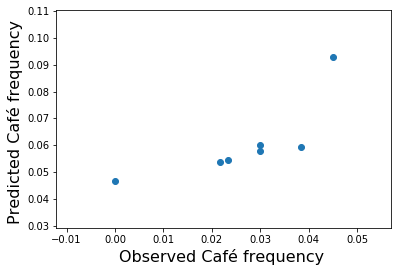

In [168]:
plt.scatter(manhattan_6['Café'], Y6_hat)
plt.xlabel('Observed Café frequency ',fontsize=16)
plt.ylabel('Predicted Café frequency ',fontsize=16)

In [172]:
new_df=pd.DataFrame(Y6_hat)
#manhattan_6['Predicted Café Frequency']=new_df
new_df

,0
0,0.053911
1,0.057955
2,0.054415
3,0.059972
4,0.059461
5,0.046696
6,0.092801


In [174]:
manhattan_6

,Neighborhood,Café,Yoga Studio,Pizza Place,Sushi Restaurant,Café predicted,Predicted Café Frequency
0,Central Harlem,0.021739,0.000000,0.021739,0.000000,0.053911,0.053911
1,Chinatown,0.030000,0.010000,0.010000,0.000000,0.057955,0.057955
2,East Harlem,0.023256,0.000000,0.023256,0.000000,0.054415,0.054415
3,Little Italy,0.030000,0.000000,0.040000,0.000000,0.059972,0.059972
4,Roosevelt Island,0.038462,0.000000,0.038462,0.000000,0.059461,0.059461
5,Stuyvesant Town,0.000000,0.000000,0.000000,0.000000,0.046696,0.046696
6,Upper East Side,0.044944,0.033708,0.022472,0.022472,0.092801,0.092801


In [179]:

manhattan_6

,Neighborhood,Café,Yoga Studio,Pizza Place,Sushi Restaurant,Predicted Café Frequency
0,Central Harlem,0.021739,0.000000,0.021739,0.000000,0.053911
1,Chinatown,0.030000,0.010000,0.010000,0.000000,0.057955
2,East Harlem,0.023256,0.000000,0.023256,0.000000,0.054415
3,Little Italy,0.030000,0.000000,0.040000,0.000000,0.059972
4,Roosevelt Island,0.038462,0.000000,0.038462,0.000000,0.059461
5,Stuyvesant Town,0.000000,0.000000,0.000000,0.000000,0.046696
6,Upper East Side,0.044944,0.033708,0.022472,0.022472,0.092801


Text(0, 0.5, 'Difference in prediction ')

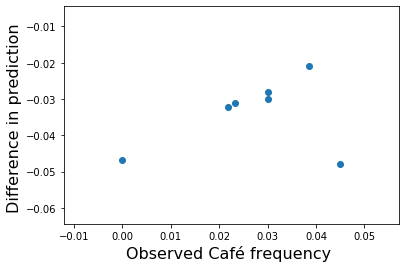

In [181]:
plt.scatter(manhattan_6['Café'], manhattan_6['Café']-manhattan_6['Predicted Café Frequency'])
plt.xlabel('Observed Café frequency ',fontsize=16)
plt.ylabel('Difference in prediction ',fontsize=16)